In [1]:
import tensorflow as tf
from keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions
from keras.layers import Dense, Flatten
from keras import Model
import numpy as np

In [2]:
# Load the ResNet50 model
resnet50 = ResNet50(include_top = False, weights='imagenet', input_shape = (32,32,3))

94765736/94765736 [==============================] - 2s 0us/step


In [3]:
resnet50.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 38, 38, 3)            0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 16, 16, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 16, 16, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [4]:
from keras.utils import plot_model

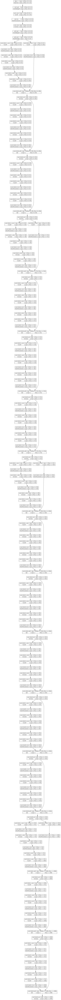

In [5]:
plot_model(resnet50, show_layer_names=True, show_shapes = True,dpi = 100)

In [6]:
# Flatten output layer of Resnet
flattened = Flatten()(resnet50.output)

# Fully connected layer 1
fc1 = Dense(128, activation = 'relu', name = 'AddedDense1')(flattened)

# Fully connected layer, output layer
fc2 = Dense(10, activation = 'softmax', name = 'AddedDense2')(fc1)

model = Model(inputs = resnet50.inputs, outputs = fc2)

In [7]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 38, 38, 3)            0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 16, 16, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 16, 16, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                          

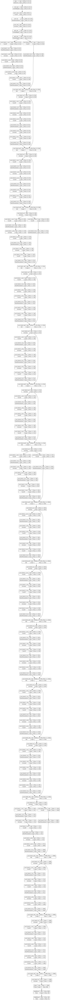

In [8]:
plot_model(model, show_layer_names=True, show_shapes = True,dpi = 100)

In [9]:
from keras.datasets import cifar10

In [10]:
(x_train, y_train),(x_test, y_test) = cifar10.load_data()
x_train = x_train.reshape(x_train.shape[0], 32,32,3)
x_test = x_test.reshape(x_test.shape[0], 32,32,3)

170498071/170498071 [==============================] - 4s 0us/step


In [28]:
model.compile(loss = 'sparse_categorical_crossentropy', optimizer='adam', metrics= [ 'accuracy'])

In [12]:
model.fit(x_train, y_train, epochs = 10)

Epoch 1/10
1563/1563 [==============================] - 111s 48ms/step - loss: 1.3548 - accuracy: 0.5404
Epoch 2/10
1563/1563 [==============================] - 70s 45ms/step - loss: 1.2522 - accuracy: 0.5623
Epoch 3/10
1563/1563 [==============================] - 69s 44ms/step - loss: 1.1652 - accuracy: 0.5974
Epoch 4/10
1563/1563 [==============================] - 69s 44ms/step - loss: 0.9658 - accuracy: 0.6702
Epoch 5/10
1563/1563 [==============================] - 68s 44ms/step - loss: 0.8465 - accuracy: 0.7129
Epoch 6/10
1563/1563 [==============================] - 67s 43ms/step - loss: 0.9262 - accuracy: 0.6819
Epoch 7/10
1563/1563 [==============================] - 68s 43ms/step - loss: 0.8927 - accuracy: 0.7009
Epoch 8/10
1563/1563 [==============================] - 70s 45ms/step - loss: 0.9846 - accuracy: 0.6629
Epoch 9/10
1563/1563 [==============================] - 68s 43ms/step - loss: 1.0359 - accuracy: 0.6411
Epoch 10/10
1563/1563 [==============================] - 67s 43

In [32]:
model.evaluate(x_test, y_test, batch_size = 1)

10000/10000 [==============================] - 80s 8ms/step - loss: 1.0449 - accuracy: 0.6685


[1.0449371337890625, 0.6685000061988831]

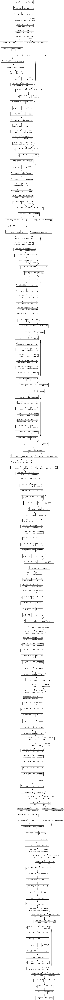

In [14]:
plot_model(model, show_layer_names=True, show_shapes = True, show_trainable=True,dpi = 100)

In [16]:
for layer in model.layers:
  print(layer.trainable, end = ' ')

True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True 

In [23]:
resnet50.trainable = False

In [24]:
model = Model(inputs = resnet50.inputs, outputs = fc2)

In [29]:
model.compile(loss = 'sparse_categorical_crossentropy', optimizer='adam', metrics= [ 'accuracy'])

In [25]:
for layer in model.layers:
  print(layer.trainable, end = ' ')

False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False Fals

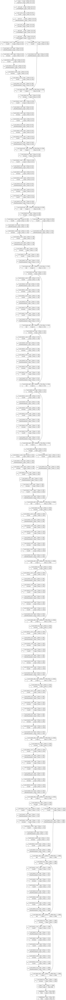

In [26]:
plot_model(model, show_layer_names=True, show_shapes = True, show_trainable=True,dpi = 100)

In [31]:
model.fit(x_train, y_train, epochs = 10)

Epoch 1/10
1563/1563 [==============================] - 18s 11ms/step - loss: 0.7456 - accuracy: 0.7298
Epoch 2/10
1563/1563 [==============================] - 18s 11ms/step - loss: 0.7434 - accuracy: 0.7318
Epoch 3/10
1563/1563 [==============================] - 19s 12ms/step - loss: 0.7313 - accuracy: 0.7342
Epoch 4/10
1563/1563 [==============================] - 18s 11ms/step - loss: 0.7272 - accuracy: 0.7358
Epoch 5/10
1563/1563 [==============================] - 20s 12ms/step - loss: 0.7189 - accuracy: 0.7380
Epoch 6/10
1563/1563 [==============================] - 17s 11ms/step - loss: 0.7242 - accuracy: 0.7404
Epoch 7/10
1563/1563 [==============================] - 18s 11ms/step - loss: 0.7066 - accuracy: 0.7414
Epoch 8/10
1563/1563 [==============================] - 18s 12ms/step - loss: 0.7007 - accuracy: 0.7432
Epoch 9/10
1563/1563 [==============================] - 18s 12ms/step - loss: 0.6971 - accuracy: 0.7461
Epoch 10/10
1563/1563 [==============================] - 18s 12m

In [33]:
model.evaluate(x_test, y_test, batch_size = 1)

10000/10000 [==============================] - 85s 8ms/step - loss: 1.0449 - accuracy: 0.6685


[1.0449371337890625, 0.6685000061988831]

In [34]:
res = ResNet50()

102967424/102967424 [==============================] - 0s 0us/step


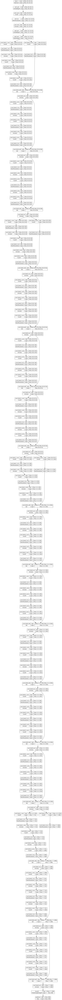

In [36]:
plot_model(res, show_shapes = True)